# CS 3262 - Final Exam - Fall 2022

Welcome to your final exam! 

Logistics:
- Open book/open note/**no internet**
- You are not allowed to discuss the exam with each other
- All questions about the exam will come to me, through email. Do not send any public messages to me, or each other about the exam.
- If there are any clarifications required, I will post them on brightspace and update this document.

A note on the **kinds** of answers I expect: As is our style on HW and in class, many of these questions are open ended and are **not** asking you to repeat what you've read or heard in class. On the contrary, if I read my own words (or a texts) I will mark that down! I expect you to demonstrate your original thoughts. Almost none of these questions require 3-word answers (some do though, those should be clear by the question!). Having said that, I also don't want you to start just typing out vocabulary words that we've used in class. 

**Tip**: If you feel you can't answer a question, skip it and come back. Sometimes reading the entire thing will help clarify the individual parts. If all else fails, I will award partial credit for effort, and a clear explanation of what you're confused about and why. 

**Try and explain your confusion!**

## Changelog

<br/>
<div class='alert alert-info'>

<font size='5'>👾</font> **Note:**  This is **version 2**, updated on 2022-12-12

</div>

## Notebook Setup

In [1]:
# imports
import numpy as np
import matplotlib.pyplot as plt
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
import seaborn as sns
import pandas as pd
import sklearn as sk

# styling additions
from IPython.display import HTML
style = '''
    <style>
        div.info{
            padding: 15px; 
            border: 1px solid transparent; 
            border-left: 5px solid #dfb5b4; 
            border-color: transparent; 
            margin-bottom: 10px; 
            border-radius: 4px; 
            background-color: #fcf8e3; 
            border-color: #faebcc;
        }
        hr{
            border: 1px solid;
            border-radius: 5px;
        }
    </style>'''
HTML(style)

# Problem 0 - Decision Trees/Random Forests

This problem will use **two extra packages** to make some nice visualizations of our trees! 

<br/>
<div class='info'>
    
<font size='5'>👇🏽</font> **Uncommment and run this cell to install these packages:**
    
</div>


In [2]:
pip install dtreeviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 145 kB/s 


In [3]:
import dtreeviz
from dtreeviz import clfviz

Now we're ready. Lets start with the **wine** dataset we used in class:

In [4]:
from sklearn.datasets import load_wine

In [5]:
wine = load_wine()
X = wine.data

In [6]:
X.shape

(178, 13)

This dataset has 13 features:

In [7]:
wine.feature_names

['alcohol',
 'malic_acid',
 'ash',
 'alcalinity_of_ash',
 'magnesium',
 'total_phenols',
 'flavanoids',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'color_intensity',
 'hue',
 'od280/od315_of_diluted_wines',
 'proline']

Lets pick a subset for easy plotting:

In [8]:
X = X[:,[12,6]]
y = wine.target

Now we're ready!

In [9]:
from sklearn.ensemble import RandomForestClassifier

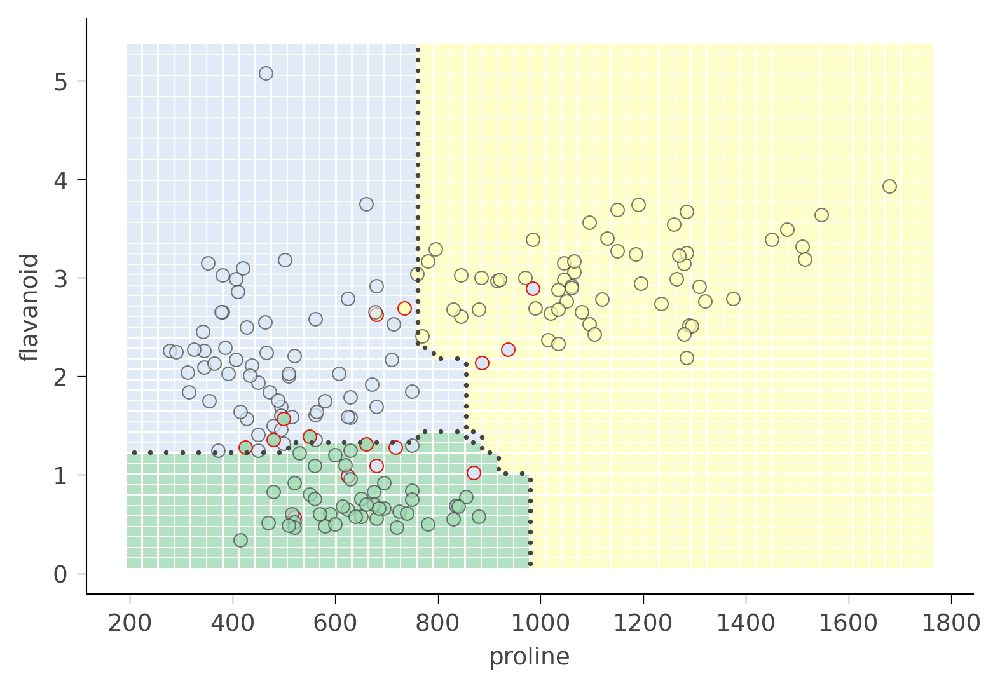

In [10]:
rf = RandomForestClassifier(n_estimators=50, min_samples_leaf=20, n_jobs=-1)
rf.fit(X, y)

fig,axes = plt.subplots(1,1,dpi=300)
clfviz(rf, X, y, ax=axes,
       # show classification regions not probabilities
       show=['instances', 'boundaries', 'misclassified'], 
       feature_names=['proline', 'flavanoid']);

<br/>
<div class='info'>

<font size='5'>🤔</font> **Pause-and-Ponder:** Below, regenerate the above analysis for different values of:

- `min_samples_leaf`
- `max_depth`
- `n_estimators`

Investigate their effect on the decision boundary!
    
</div>

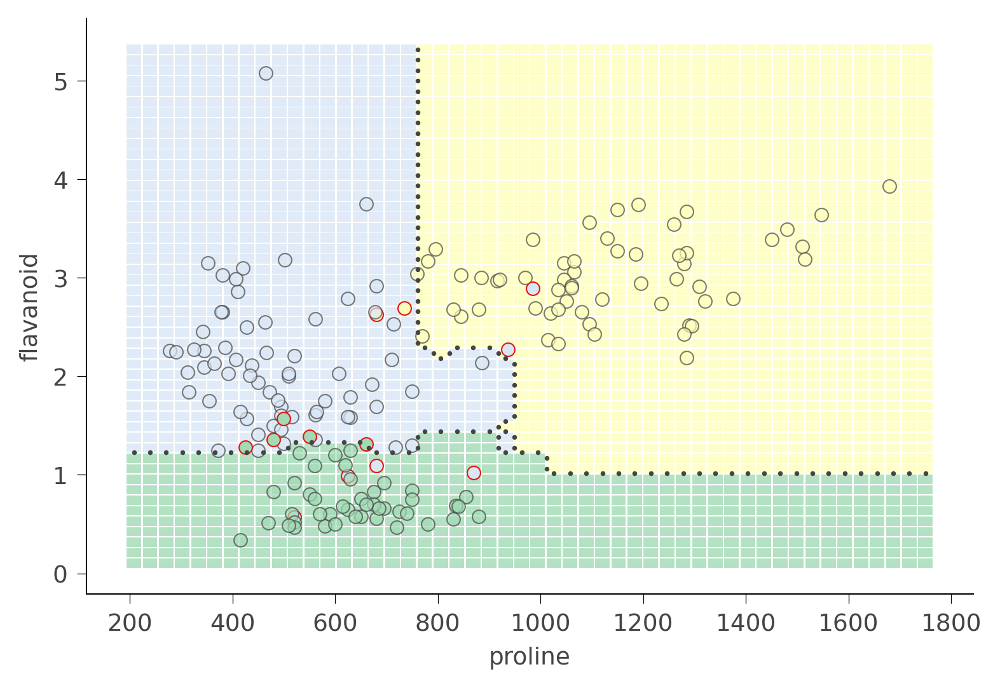

In [12]:
rf = RandomForestClassifier(n_estimators=50, min_samples_leaf=5, n_jobs=-1)
rf.fit(X, y)

fig,axes = plt.subplots(1,1,dpi=300)
clfviz(rf, X, y, ax=axes,
       # show classification regions not probabilities
       show=['instances', 'boundaries', 'misclassified'], 
       feature_names=['proline', 'flavanoid']);

At low Minimum Leaf, number of decision boundaries increases. At very high minimum number of leaf , there is no decision boundary.

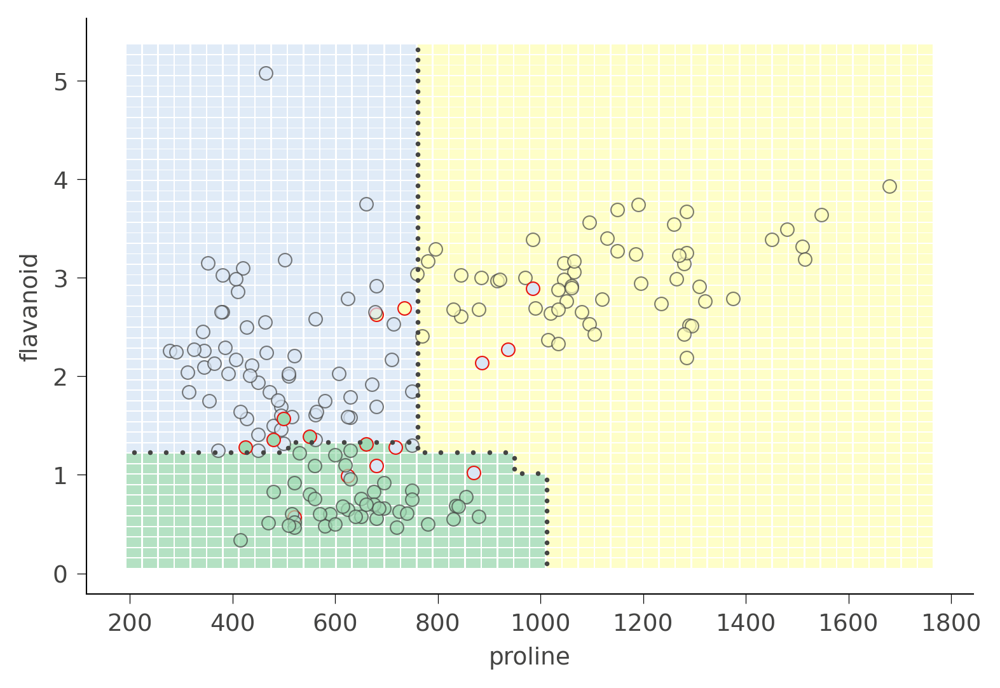

In [13]:
rf = RandomForestClassifier(n_estimators=50, min_samples_leaf=20, n_jobs=-1,max_depth=10)
rf.fit(X, y)

fig,axes = plt.subplots(1,1,dpi=300)
clfviz(rf, X, y, ax=axes,
       # show classification regions not probabilities
       show=['instances', 'boundaries', 'misclassified'], 
       feature_names=['proline', 'flavanoid']);

By increasing Max_depth,  the decision boundaries becomes less segmental and error decreases.

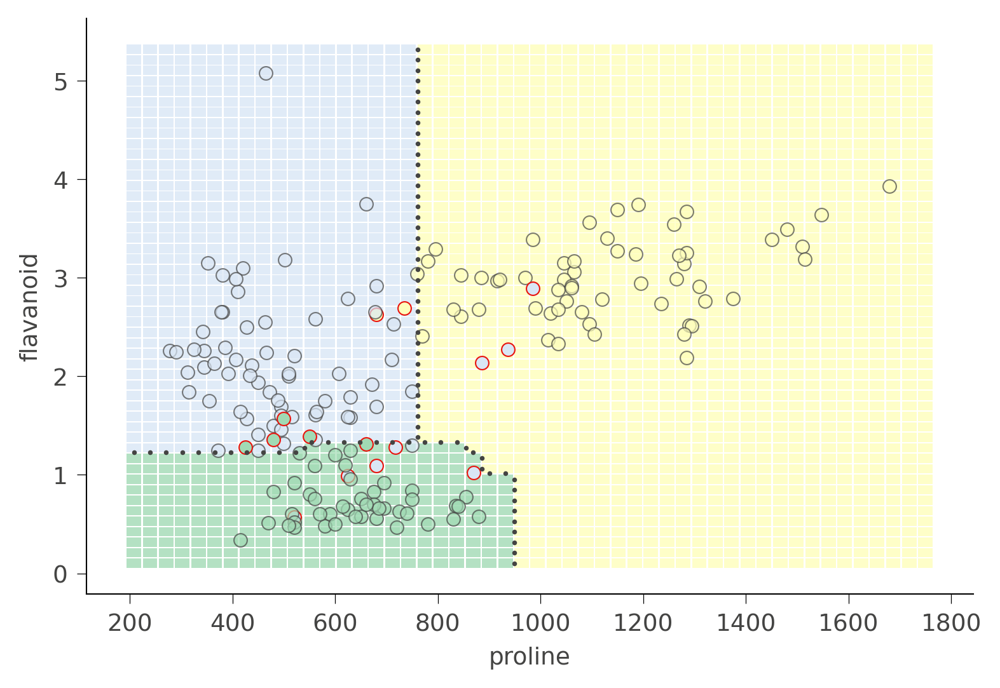

In [14]:
rf = RandomForestClassifier(n_estimators=150, min_samples_leaf=20, n_jobs=-1)
rf.fit(X, y)

fig,axes = plt.subplots(1,1,dpi=300)
clfviz(rf, X, y, ax=axes,
       # show classification regions not probabilities
       show=['instances', 'boundaries', 'misclassified'], 
       feature_names=['proline', 'flavanoid']);

By increasing number of estimator, the boundary line becomes segmental

<br/>
<div class='info'>

<font size='5'>🤔</font> **Pause-and-Ponder:**  After completing the above analysis, write your observations below! Give a well thought-out answer here!

</div>

---

At low Minimum Leaf number of decision boundaries increases. This causes overfitting problem. At very high minimum number of leaf , there is no decision boundary  and all data points are predicted as one label.   
BY increasing Max_depth,  the decision boundaries becomes less segmental and error decreases.    

By increasing number of estimator, the boundary line becomes segmental and it will look at more trees so more different scenarios are discussed and noise effect will decrease.

# BONUS B1 - PCA

For this bonus problem, run PCA on the **full** wine dataset we imported above! 

In [77]:
from sklearn.decomposition import PCA

<br/>
<div class='info'>
    
<font size='5'>👆🏽</font> **Note:** I have **intentionally** not given you a code example for this problem! Try **reading the sklearn documentation** and use what we currently know to see how to specify a PCA yourself!
    
</div>

In [78]:
wine = load_wine()
X = wine.data
X = X[:,[12,6]]
y = wine.target

In [79]:
PCA?

In [80]:
pca = PCA(n_components = 2)
PCAX=pca.fit_transform(X)

In [81]:
zero=PCAX[y==0,:]
one=PCAX[y==1,:]
two=PCAX[y==2,:]

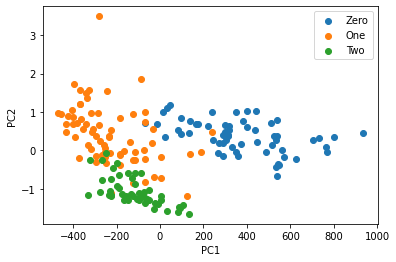

In [82]:
plt.figure()
plt.scatter(zero[:,0],zero[:,1],label='Zero');
plt.scatter(one[:,0],one[:,1],label='One');
plt.scatter(two[:,0],two[:,1],label='Two');
plt.xlabel('PC1')
plt.ylabel('PC2');
plt.legend()

<br/>
<div class='info'>

<font size='5'>🤔</font> **Pause-and-Ponder:**  Comment below on the quality of the fit! How did PCA do on this dataset? Give a good answer here!

</div>

---

The PCA does not do well one the dataset. Since it does not help increase spread of data comparing to the original dataset.(i.e. Maximizing Variance) The goal of PCA is to increase spread to help classification problem . 

---

<br/>
<div class='info'>

<font size='5'>🤔</font> **Pause-and-Ponder:**  Explain what exactly PCA is **doing** to our dataset. How is it different than linear regression? Comment below!

</div>




---

PCA, itself is not a machine learning algorithm to predic or classify. It basically prepare the dataset by increasing the spread so that the output can be used  by other machine learning techniques such as Logistic Regression. As you can see in the code, I mention the labels for each category and PCA does not predict or diagnose the labels, while in Logistic Regression , we basically predict the labels.

---

# Bonus B2 - KMeans

For this problem run a **K-Means** on the **result of your PCA dimensionality reduced data** for the following:
- 2 components
- 5 components
- 10 components

**And give the three plots!**

<br/>
<div class='info'>
    
<font size='5'>👆🏽</font> **Note:** I have **intentionally** not given you a code example for this problem! Try **reading the sklearn documentation** and use what we currently know to see how to specify a KMeans yourself!
    
</div>

In [83]:
from sklearn.cluster import KMeans
KMeans?

Component= 2  Axis titles are PC2 and PC1 ,respectively


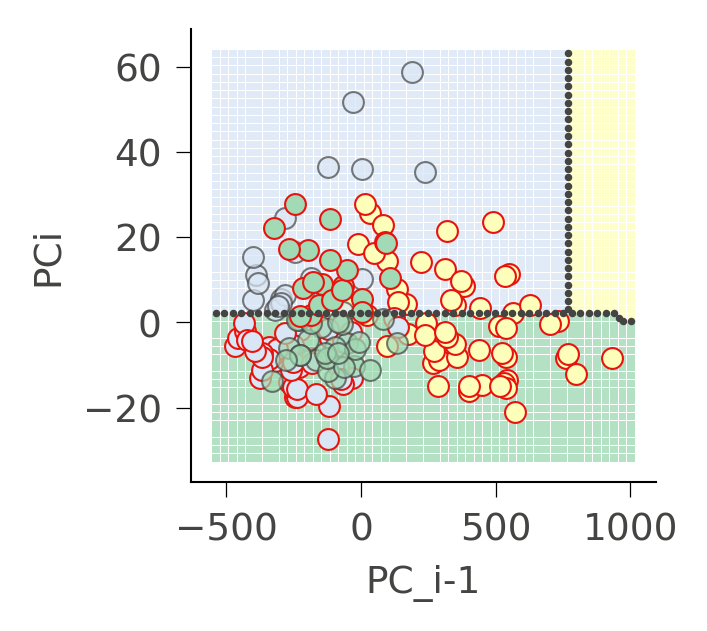

Component= 5  Axis titles are PC5 and PC4 ,respectively


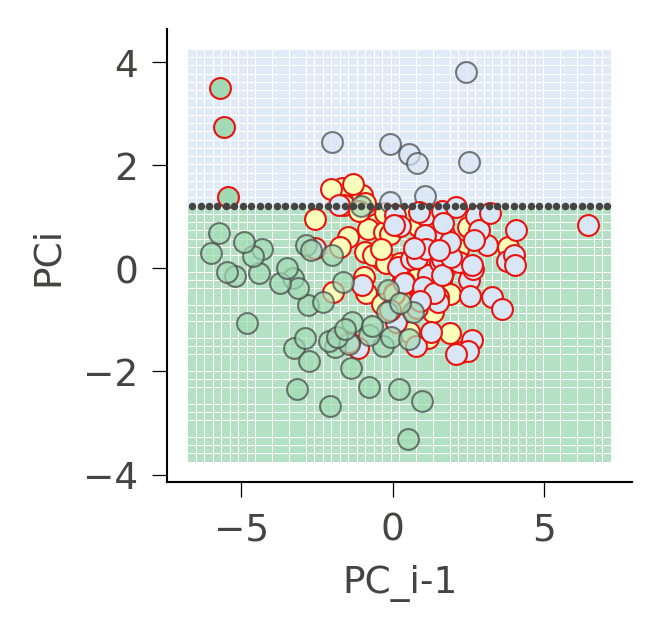

Component= 10  Axis titles are PC10 and PC9 ,respectively


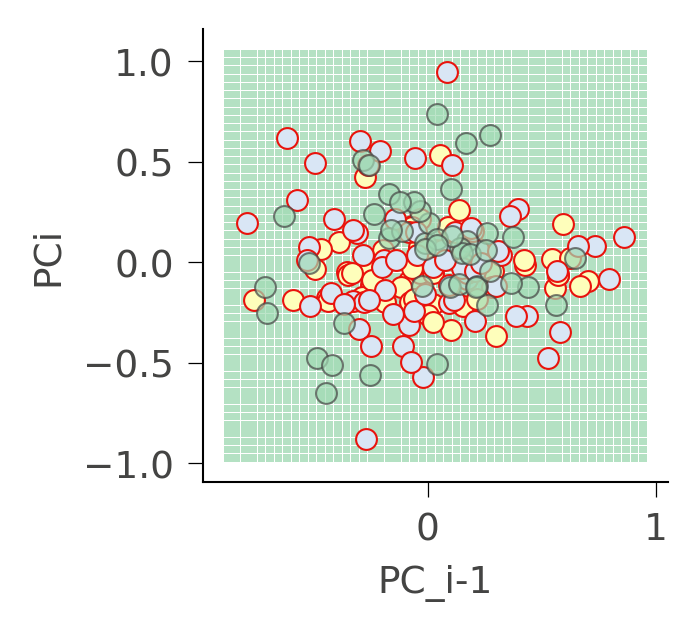

In [ ]:
comps=[2,5,10]
for i in comps:
  wine = load_wine()
  l=1
  X = wine.data
  y = wine.target
  pca = PCA(n_components =i )
  PCAX=pca.fit_transform(X)
  kmeans = KMeans(n_clusters=3, random_state=0)
  kmeans.fit(PCAX)
  fig,axes = plt.subplots(l,l,dpi=300)
  fig.set_size_inches(2,2)
  clfviz(rf, PCAX[:,i-2:i], y, ax=axes,
       # show classification regions not probabilities
       show=['instances', 'boundaries', 'misclassified'], 
       feature_names=['PC_i-1', 'PCi']);
  print('Component= '+str(i)+ '  Axis titles are PC'+str(i)+' and PC'+str(i-1)+' ,respectively')
  plt.show()

<br/>
<div class='info'>
    
<font size='5'>🤔</font> **Pause-and-Ponder:**  How are KMeans KNN's different? How are they similar? Explain!

</div>

---

In the above, I plotted two principal component for 3 different component values. For 2 component, PC1 and PC2, For 5 component, PC4 and PC5 and for 10 components, PC9 and PC10. The model does not perform very well for KNN specially at higher principal components. 

# Problem 1


Lets discuss a **regularized linear regression** given by:

$$
\min_w \| \boldsymbol{X}w-y \|^2_2 + \alpha \|w\|^2_2 
$$

## 1.A
This equation has two terms. The term on the left is the usual **linear regression error** we discussed in class.

<br/>
<div class='info'>

<font size='5'>🤔</font> **Question:**  If $\boldsymbol{X}$ is of size $100 \times 3$,

- what is the dimension of $w$?
- what is th dimension of $y$?
- how big is my dataset?

</div>

---

w: 3 by 1,  
y:100 by 1,  
100 Data

# 1.B

Now for the second term!

<br/>
<div class='info'>

<font size='5'>🤔</font> **Questions:** Explain in words what the second term is doing? How does having it in here **regularize** the problem?

</div>

<br/>
<div class='info'>

<font size='5'>☝🏽</font> **Hint:**  We gave three different explanations for this in class! 

</div>

---

The second term shows the penalty for wrong predictions. Basically, with regularization,  we decrease  our Hypothesis space.  It will limit slopes and intercepts of lines and therefore will decrease variance i.e. hypotheses become more similar.
Since the variance decreases significantly , it will help decrease overal error in our problem ( and the overfitting)

## 1.C

In sklearn, the regularized linear regression is implemented in a class called `Ridge` in the `linear_model` module, and takes an `alpha` parameter as discussed above:

In [15]:
from sklearn.linear_model import Ridge

In [16]:
Ridge?

Lets implement this model on the same wine dataset above with different `alpha` values:

In [17]:
alphas = [1e-2,1e-1,0.5,1,5]

In [19]:
wine = load_wine()
X = wine.data
X = X[:,[12,6]]
y = wine.target
score=[]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
for i in alphas:
  clf = Ridge(alpha=i)
  clf.fit(X_train, y_train)
  a=clf.score(X_test, y_test)
  score.append(a)

In [21]:
score

[0.5079145129541722,
 0.5086760432796992,
 0.5120246000961848,
 0.5161288824666361,
 0.5459452661530066]

## 1.D

<br/>
<div class='info'>

<font size='5'>🤔</font> **Question:**  Comment on what you observe here. Which does better? Why? Does this make sense given what we've discussed in class? Why or why not? I'm not looking for a short answer here!

</div>

---

The wine problem is a classification problem. Normally, logistic regression algorithms work with 2 labels but we have 3 labels in this problem. One good parameter to evaluate the performance of the model is clf.score.    
The score in linear regression gives R2. In other words, it shows the accuracy on test data sets (how accurate is the prediction vs actual label). In here, we can see that by increasing alpha, our accuracy increases. ( Error decreases). This makes sense since by increasing alpha , we  are puting a constrain on results and increasing the penalty of incorrect prediction. Therefore, the accuracy of the model increases.


# Problem 2

## 2.A

<br/>
<div class='info'>
    
<font size='5'>🤔</font> **Question:** Explain these concepts in words:
- underfitting
- overfitting
- bias
- variance

Draw a figure (draw it yourself, **not** using any code) to aid in your explanation!
   
</div>

**Note:** Once you've drawn this figure, either on paper, or using your mouse using an online tool, etc. you can **embed it** into your notebook like this:

```
![](foldername/figurename.jpg)
```

---

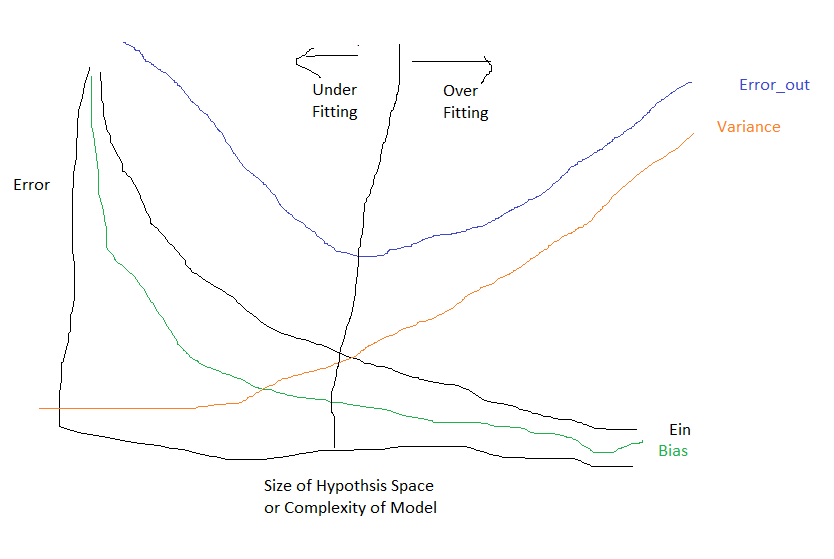

Error on the test set comes from stochastic error ( due to the noise) , Bias and variance. Bias is the difference between average of all hypotheses and actual value. At small hypothesis space, Bias is high and it decreases as we add to the complexity of model. Variance shows how different each hypothesis is from average. The spread of data increases as the hypothesis spaces and complexity of the model increases.   
Therefore, by adding to the complexity of the model, the Eout at first decreases and then increases.   
In low hypothesis space, Ein and Eout are both high and we have the problem of underftting. However, for very complex model, we basically try to memorize the noise and with that, we increase the error on train set. With more complex error , the average of our model matches the actual function ( Bias decreases) but at the same time the variance increases which causes overfitting.


---

## 2. B

<br/>
<div class='info'>

<font size='5'>🤔</font> **Question:**  Above, you explained waht the `C` parameter does for SVMs. Now, explain it but from the perspective of **regularization**! That is, how does it act as a regularizer for the SVM? Think about it!

</div>

---


Regularization penalizes incorrect prediction. By using regularization, we basically impose constrain on our hypotheses which in turn decreases the variance . Although, the bias increases a little bit, regularization solves the problem of overfitting by decreasing the variance ( hypotheses becomes more similar to the average). \\
In SVM, by increasing C, we basically increase the cost of incorrect prediction for the model's error. This will lead to harder margins (i.e. size of margin decreases) and lower number of points will determine the support vectors. ( variance decreases)


# Problem 3 - Machine Learning Mini Project

On this final, I want you to use everything you've learned and try to do a simple problem from start to finish on your own!

Lets use a dataset from Spotify on song popularity. Lets first modify the dataset for our final:


# Initial Preparation

In [40]:
# imports
import numpy as np
import matplotlib.pyplot as plt
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
import seaborn as sns
import pandas as pd
import sklearn as sk

# styling additions
from IPython.display import HTML
style = '''
    <style>
        div.info{
            padding: 15px; 
            border: 1px solid transparent; 
            border-left: 5px solid #dfb5b4; 
            border-color: transparent; 
            margin-bottom: 10px; 
            border-radius: 4px; 
            background-color: #fcf8e3; 
            border-color: #faebcc;
        }
        hr{
            border: 1px solid;
            border-radius: 5px;
        }
    </style>'''
HTML(style)

In [41]:
df = pd.read_csv('song_data_orig.csv')
df.columns

Index(['song_name', 'song_popularity', 'song_duration_ms', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature',
       'audio_valence'],
      dtype='object')

As we can see, `song_popularity` is actually a numeric column:

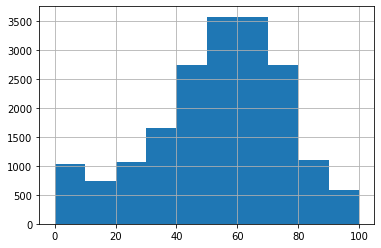

In [42]:
df['song_popularity'].hist();

Lets make this a "class label" called `is_pop` using a threshold value of 80:

In [43]:
df['is_pop'] = (df['song_popularity'] >= 80).values.astype('int')

In [44]:
df.query('is_pop == 1')

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,is_pop
5,Bring Me To Life,80,235893,0.008950,0.316,0.945,0.000002,4,0.3960,-3.169,0,0.1240,189.931,4,0.320,1
6,Last Resort,81,199893,0.000504,0.581,0.887,0.001110,4,0.2680,-3.659,0,0.0624,90.578,4,0.724,1
8,Mr. Brightside,80,222586,0.001080,0.330,0.936,0.000000,1,0.0926,-3.660,1,0.0917,148.112,4,0.234,1
9,Sex on Fire,81,203346,0.001720,0.542,0.905,0.010400,9,0.1360,-5.653,1,0.0540,153.398,4,0.374,1
13,Can't Stop,81,269000,0.017900,0.618,0.938,0.000000,9,0.1670,-3.442,1,0.0456,91.455,4,0.875,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18671,Tie Me Down (with Elley Duhé),84,218295,0.135000,0.548,0.839,0.000000,6,0.1020,-2.371,1,0.0644,98.932,4,0.314,1
18697,Magic In The Hamptons (feat. Lil Yachty),85,164640,0.660000,0.769,0.479,0.000000,1,0.0914,-5.339,1,0.0385,96.051,4,0.803,1
18702,Body,86,163216,0.047600,0.752,0.764,0.000094,1,0.0543,-4.399,1,0.0380,121.958,4,0.582,1
18704,If You're Over Me,81,189000,0.061500,0.647,0.853,0.000000,8,0.0620,-4.516,1,0.0904,103.846,4,0.618,1


Now we have our label, so lets get rid of the `song_popularity` so we don't accidentally use it below!

In [45]:
df = df.drop('song_popularity',axis=1)
df.columns

Index(['song_name', 'song_duration_ms', 'acousticness', 'danceability',
       'energy', 'instrumentalness', 'key', 'liveness', 'loudness',
       'audio_mode', 'speechiness', 'tempo', 'time_signature', 'audio_valence',
       'is_pop'],
      dtype='object')

Now we're ready to proceed!

# Machine Learn!


<br/>
<div class='info'>

<font size='5'>🧑🏽‍💻</font> **CODE-IT-UP**: 
I want you to take this dataset and create at least 4 separate models **(KNN with different values of K all count as a single model)** to predict the `is_pop` variable. 

Assess each of them separately, and then jointly at the end!

    
</div>

# Exploratory Data Analysis (EDA)

Below, conduct some EDA on this dataset. Observe your features. Are they related to each other? If so, how? If not, does that matter?



<br/>
<div class='info'>

<font size='5'>🙋🏽‍♀️</font> **Hint**: We've been using a great particular plot for EDA in class and on our HW! 

</div>

**Note:** I am **not** asking for a single plot here!

In [46]:
df

,song_name,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,is_pop
0,Boulevard of Broken Dreams,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474,0
1,In The End,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370,0
2,Seven Nation Army,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324,0
3,By The Way,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198,0
4,How You Remind Me,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18830,Let It Breathe,159645,0.893000,0.500,0.151,0.000065,11,0.1110,-16.107,1,0.0348,113.969,4,0.300,0
18831,Answers,205666,0.765000,0.495,0.161,0.000001,11,0.1050,-14.078,0,0.0301,94.286,4,0.265,0
18832,Sudden Love (Acoustic),182211,0.847000,0.719,0.325,0.000000,0,0.1250,-12.222,1,0.0355,130.534,4,0.286,0
18833,Gentle on My Mind,352280,0.945000,0.488,0.326,0.015700,3,0.1190,-12.020,1,0.0328,106.063,4,0.323,0


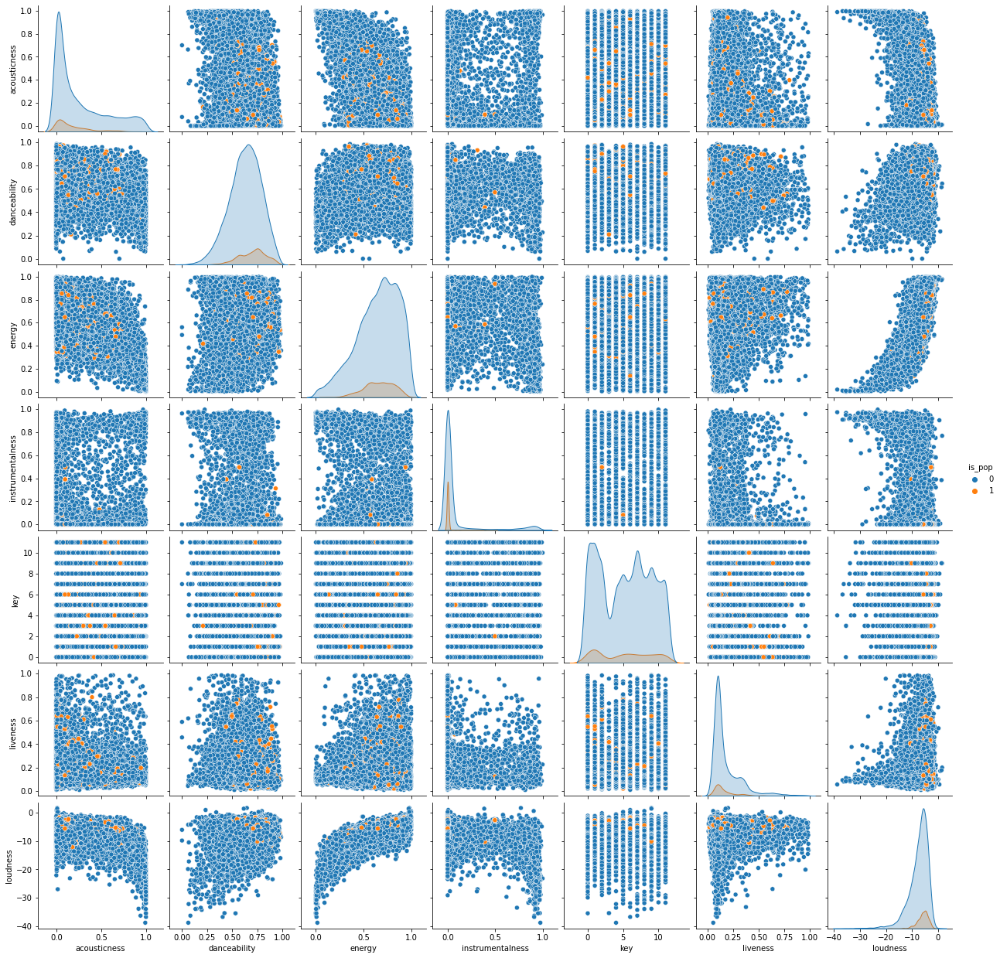

In [47]:
#I looked at different pair-plots
sns.pairplot(df, vars=df.columns[2:9], hue='is_pop');

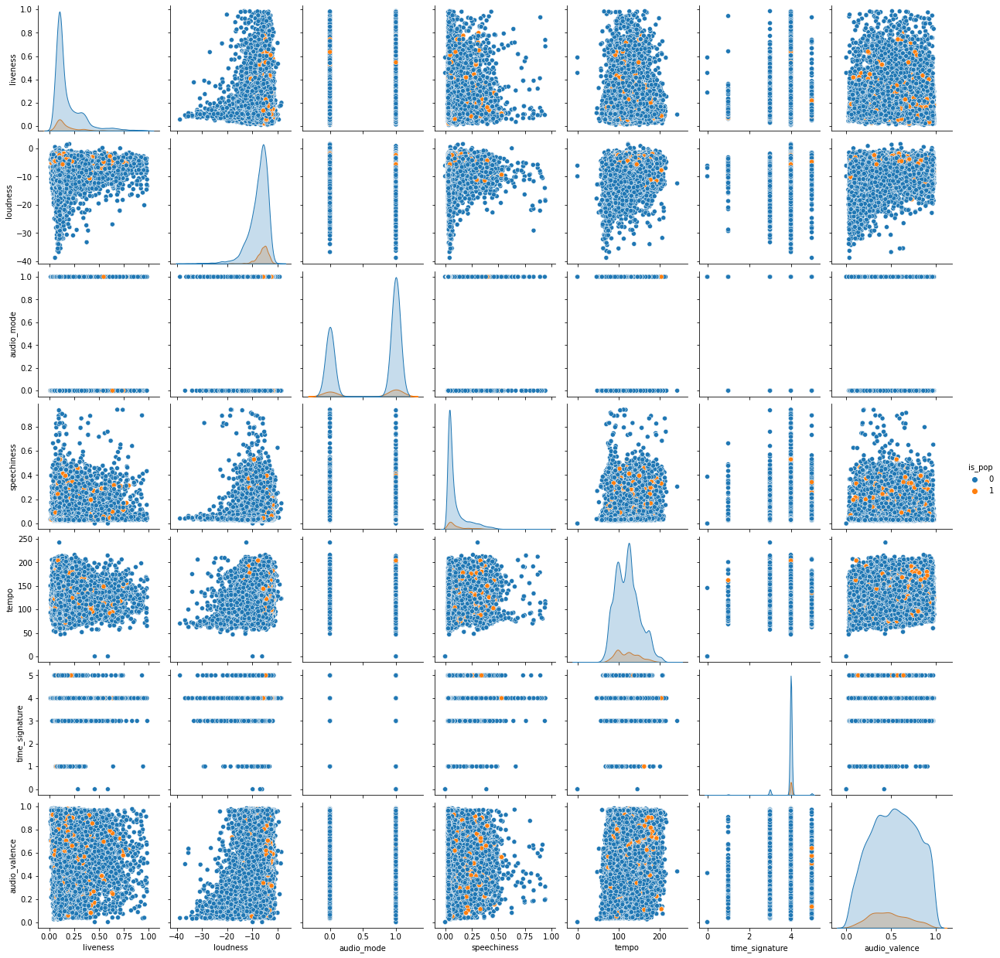

In [48]:
sns.pairplot(df, vars=df.columns[7:14], hue='is_pop');

<br/>
<div class='info'>
    
<font size='5'>🤔</font> **Pause-and-Ponder:**  Now that you've done some exploration, write down your comments/observations here. What did you observe?

    
</div>

---

The data is very noisy and pair plots does not show the relation between features for the two labels.  Moreover, the range of features are different significantly . This may cause issue in some models such as KNN.

---

# Prepare your dataset

Using your insight from above, and in preparation of your plan below, is there anything else you need to do to "prepare" your dataset? 

Before you code it up, comment below what you will do **and why**. That is, explain why you are doing something extra to the dataset! Use the tools/techniques and concepts we learned in class!


<br/>
<div class='info'>

<font size='5'>🙋🏽‍♀️</font> **Hint**: Right now, we only have a single dataset - we probably need to at least carve out a test set! 

</div>

<div class='info'>

<font size='5'>🙋🏽‍♀️</font> **Hint**: **Hint**: Do we need to do anything else to our features? Think about this!

</div>

<div class='info'>

<font size='5'>🙋🏽‍♀️</font> **Hint**: **Hint**: These are **not** the only thing I expect you to do here! I want you think about this! 
</div>

<div class='info'>
    
<font size='5'>🤔</font> **Pause-and-Ponder:**  Below, write down **your plan of action** - based on this EDA - what are you going to try? And Why?
    
</div>

---

The first step is that since the data are in  different scales, we should apply feature scaling. Then we need to divide our data set to a train set and test set so we can evaulate the performance of our model. The  other preporocessing step is to apply PCA. PCA will increase the  variance and so will make classification easier.

---

In [49]:
#Based on above plots, categorical data will  not be very helpful for classification. So we remove those data.
df = df.drop(['song_name','audio_mode','key','time_signature'],axis=1)

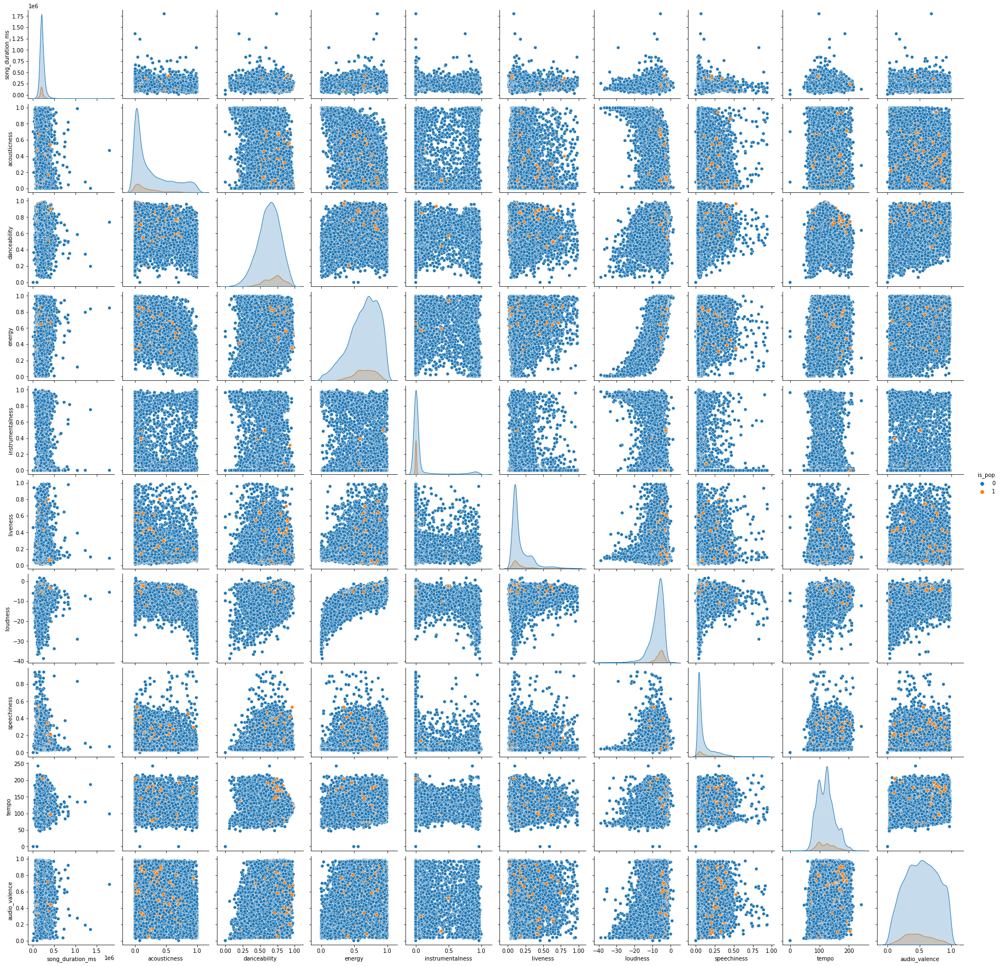

In [50]:
#Now let's have another look at their pair plots
sns.pairplot(df, vars=df.columns[0:10], hue='is_pop');

Still Data looks very sporadic . In order to have a better classification, we use PCA and plot pair of different components

In [51]:
df.columns

Index(['song_duration_ms', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'audio_valence', 'is_pop'],
      dtype='object')

In [52]:
from sklearn.preprocessing import MinMaxScaler
minmax_scaler = MinMaxScaler()
from sklearn.preprocessing import StandardScaler
std_scaler = StandardScaler()
from sklearn.metrics import confusion_matrix, classification_report, RocCurveDisplay, ConfusionMatrixDisplay, auc

In [53]:
#dan = df['danceability'].values.reshape(-1,1)
#tempo=df['tempo'].values.reshape(-1,1)
#tempo = minmax_scaler.fit(tempo).transform(tempo)
#X = np.concatenate((dan, tempo), axis=1)
L = df.iloc[:,0:10]
y=df['is_pop']

X1 = std_scaler.fit(L).transform(L)

In [54]:
y=df['is_pop'].values.reshape(-1,1)
#from sklearn.decomposition import PCA
#pca = PCA(n_components = 10)
from sklearn.decomposition import KernelPCA
kpca = KernelPCA(n_components = 7, kernel = 'sigmoid')
PCAX = kpca.fit_transform(X1)
X = np.concatenate((PCAX, y), axis=1)
df2 = pd.DataFrame(X, columns = ['C1','C2','C3','C4','C5','C6','C7','I'])

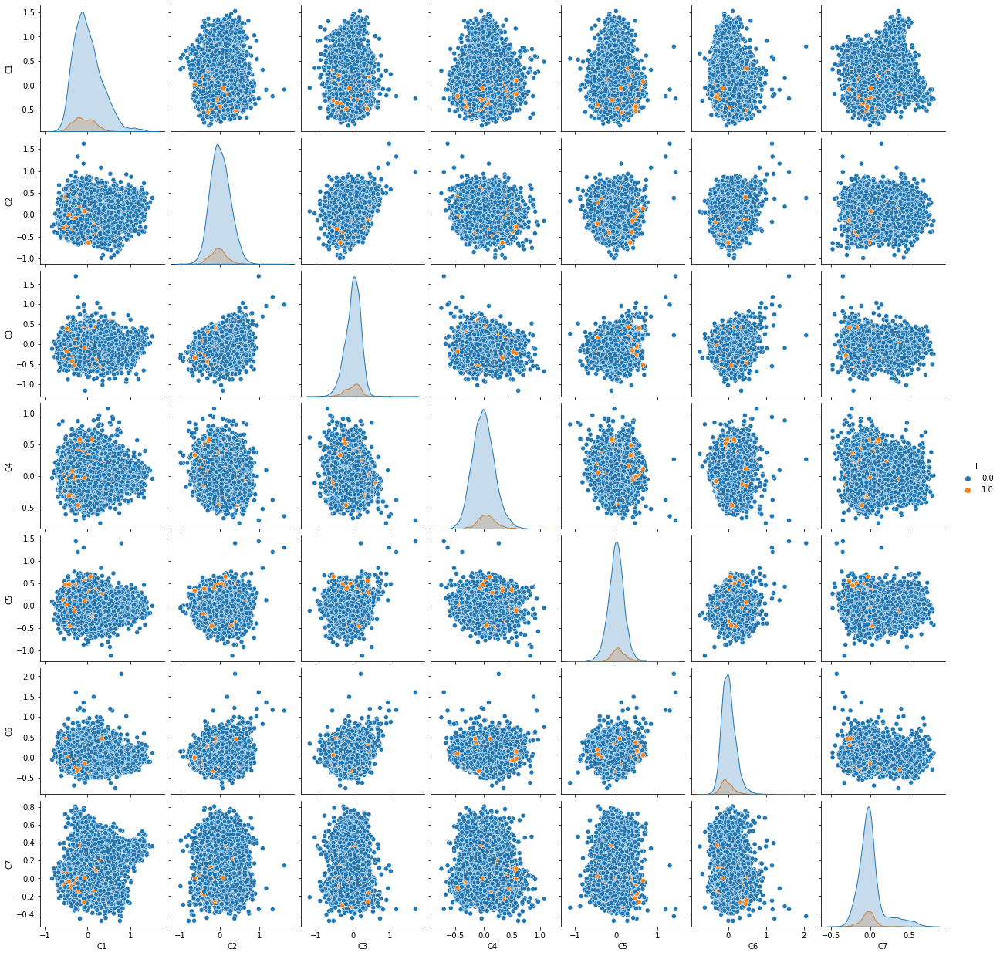

In [55]:
sns.pairplot(df2, vars=df2.columns[0:7], hue='I');

Now we can see that we can use these components for classification

In [56]:
X=PCAX
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

# ML Models

For each of your models below, **train** and **evaluate** them! 

For each, write **why** you are evaluating them in a certain way, and **how** you chose a particular value for a parameter, etc. 

<br/>
<div class='info'>
    
<font size='5'>🙋🏽‍♀️</font> **Tip**: You **are** allowed to use the scikit learn documentation [🔗 linked here](https://scikit-learn.org/stable/index.html)!
    
</div>

## Model 1 - Decision Tree

For the first model, I used decision tree classifier. I used random_state=0, to get a consistent results among different calls.

To evaluate the model, we used accuracy from sklearn metrics as well as confusion matrix and AUC.    
ACC or acuracy  shows percentage of correct predictions while  AUC shows accuracy for model among all threshholds.  
Confusion Matrix shows number TP,FP,TN and FN in the comparison of our prediction and test set.

ACC= 0.957 and AUC =0.98

In [57]:
from sklearn.tree import DecisionTreeClassifier
Decision_Tree = DecisionTreeClassifier(random_state = 0)
Decision_Tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=0)

In [58]:
y_pred = Decision_Tree.predict(X_test)

In [59]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm_decision_tree = confusion_matrix(y_test, y_pred)
accuracy_score(y_test, y_pred)

0.9571034189849225

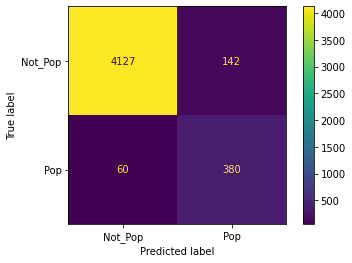

In [60]:
target_names=['Not_Pop','Pop']
disp = ConfusionMatrixDisplay(confusion_matrix=cm_decision_tree, display_labels=target_names)
disp.plot();

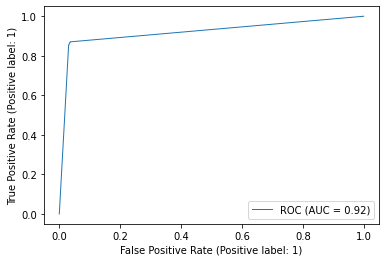

In [61]:
RocCurveDisplay.from_estimator(Decision_Tree,X_test,y_test,name='ROC',lw=1);

## Model 2 - KNN



In KNN model, number of neighbors was chosen as 4 as it gave the highest accuracy (ACC) and AUC.

To evaluate the model, we used accuracy from sklearn metrics as well as confusion matrix and AUC.    
ACC or acuracy  shows percentage of correct predictions while  AUC shows accuracy for model among all threshholds.  
Confusion Matrix shows number TP,FP,TN and FN in the comparison of our prediction and test set.   

ACC= 0.94 and AUC =0.97

In [62]:
from sklearn.neighbors import KNeighborsClassifier
n_neighbors = 4

In [63]:
knn_model = KNeighborsClassifier(n_neighbors)
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test)
knn_cm = confusion_matrix(y_test, y_pred)
accuracy_score(y_test, y_pred)


/usr/local/lib/python3.8/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


0.940327033340412

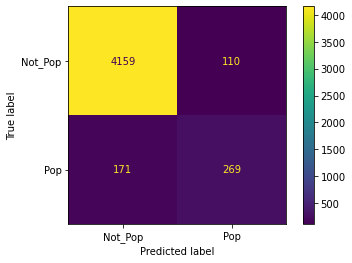

In [64]:
target_names=['Not_Pop','Pop']
disp = ConfusionMatrixDisplay(confusion_matrix=knn_cm, display_labels=target_names)
disp.plot();

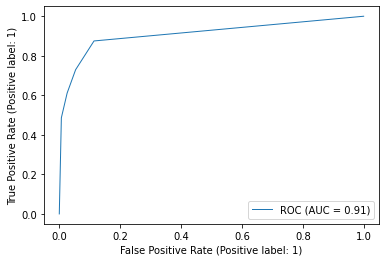

In [65]:
RocCurveDisplay.from_estimator(knn_model,X_test,y_test,name='ROC',lw=1);

## ML Model 3 - SVM

C parameter was chosen in a way that error decreases while it can solve the problem in a reasonable time.      
For Type of Kernel, linear and RBF were compared. Linear kernel predicted all songs as not_pop which is not accurate and so it had very low AUC ( 0.65). So for that 'rbf' Kernel was chosen.    
Although better,'rbf' still has a low AUC (0.89) and cannot predict pop musics very well based on confusion matrix.    
ACC or accuracy score is not very helpful in telling the accuracy  of the model.

In [66]:
from sklearn.svm import SVC # "Support vector classifier"
SVC_model = SVC(kernel='rbf', C=5e1)
SVC_model.fit(X_train, y_train);

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [67]:
y_pred = SVC_model.predict(X_test)
SVC_cm = confusion_matrix(y_test, y_pred)
accuracy_score(y_test, y_pred)

0.9139944786578892

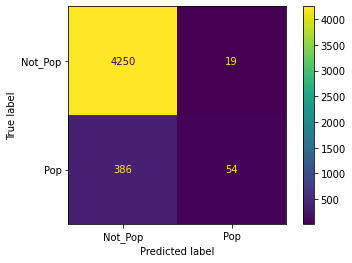

In [68]:
target_names=['Not_Pop','Pop']
disp = ConfusionMatrixDisplay(confusion_matrix=SVC_cm, display_labels=target_names)
disp.plot();

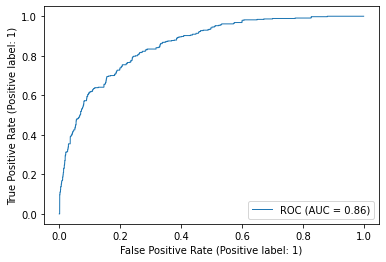

In [69]:
RocCurveDisplay.from_estimator(SVC_model,X_test,y_test,name='ROC',lw=1);

## ML Model 4 - Random Forest

The random forest parameters such as number of esimators and minimum leaf number were chosen based on the problem 0 study. The goal is to decrease the noise while avoiding overfitting.  
The confusion Matrix for this model also shows that it cannot perform very well in predicting pop song. ACC and AUC are not telling the whole story in this case.

In [70]:
pip install dtreeviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [71]:
import dtreeviz
from dtreeviz import clfviz

In [72]:
from sklearn.ensemble import RandomForestClassifier

In [73]:
rf = RandomForestClassifier(n_estimators=100, min_samples_leaf=8, n_jobs=-1)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

<ipython-input-73-6e5e3b8cd30a>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train, y_train)


In [74]:
RF_cm = confusion_matrix(y_test, y_pred)
accuracy_score(y_test, y_pred)

0.9481843278827776

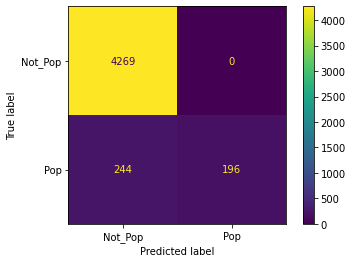

In [75]:
target_names=['Not_Pop','Pop']
disp = ConfusionMatrixDisplay(confusion_matrix=RF_cm, display_labels=target_names)
disp.plot();

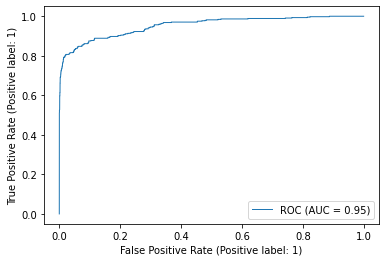

In [76]:
RocCurveDisplay.from_estimator(rf,X_test,y_test,name='ROC',lw=1);

# Comparison/Evaluation/Comments

Here, write down your thoughts on the above 4 models.

* How did they perform individually? 
* How can we compare them?
* Which one did "best" and why do you think this?
* etc.

**Include any figures/plots in your explanation to help your explanation!**

<br/>
<div class='info'>
    
<font size='5'>🙋🏽‍♀️</font> **Hint**: A confusion matrix is probably a good start!
    
</div>

In the following figures, we can see Confusion Matrix and AUC plots for each sample.  We evaluated ACC ( accuracy score) for each model separately, as mentioned above.   

Note :  In the model,  NOT_pop and pop are considered as positive and negative, respectively!

ACC is not telling the story of performance of the model. For instance, SVM's accuracy score is above 0.9 but it  predicts most of pop musics as not pop. So if the focus is to find the pop music in a dataset, this is a big issue.   

The goal of the project is to be able to predict pop music correctly. In that sense, the best model is Decision tree as it can find 86 %   ( 380/(380+60) of pop musics. After decision tree model, we have KNN ( 61%), Random Forest (44.8%) and SVM (12.2 %) for the accuracy of predicting a pop music.

AUC curves in this analysis are not very helpful because  it considers Not_pop as positive and plots TPR vs FPR for AUC. However, the focus of the study is to find POP musics which are considered as negative in the problem.


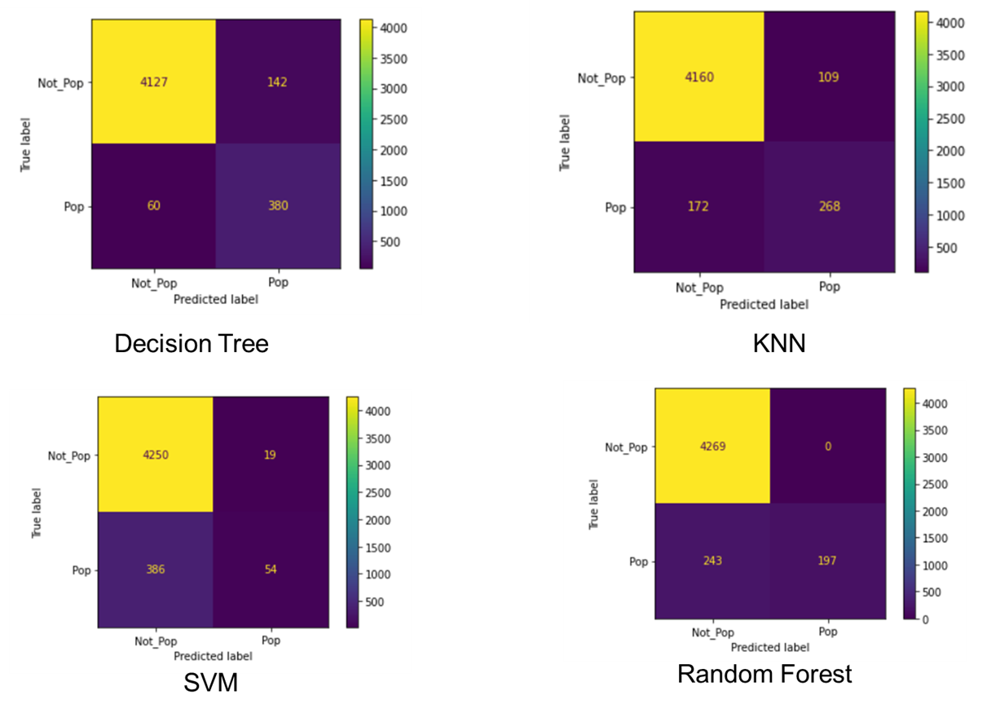

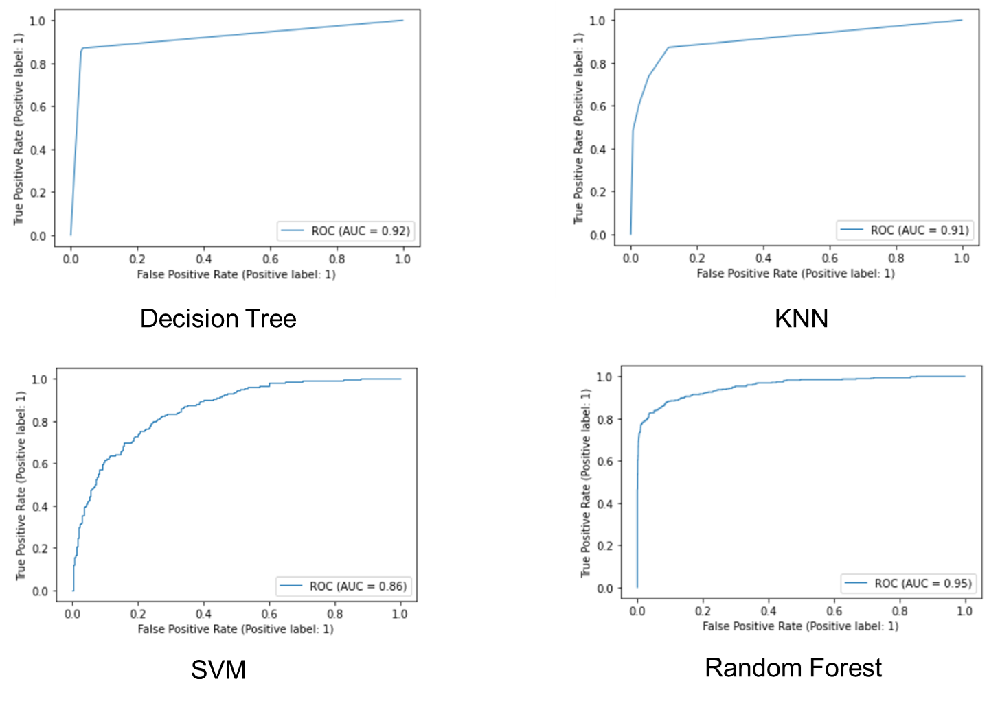

---

---

---

# Bonus - B3 - NN

<br/>
<div class='info'>
    
<font size='5'>🙋🏽‍♀️</font> **Pause-and-Ponder:**  If we were to train a NN on this dataset, how big should our input layer be? How big should your output layer be?
    
</div>

---

---